In [1]:
import os
import sys
sys.path.append("/home/szt/ProtoKD_Extension_April_02_2024/Attempt_3/Scripts")
import verifications  # Import the module itself to get a module object
import importlib  # Import the importlib module
import metrics
importlib.reload(verifications)
importlib.reload(metrics)
from plotting import display_images_in_grid
from verifications import test_generator, compare_csv_original_image_columns, check_mapping_correctness
from metrics import *
from convert_csv_to_json import *
from protonet_precision_recall_heatmap import *
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import numpy as np
import cv2
import random
import pandas as pd
import re
import glob
from math import ceil
import tensorflow as tf
from tensorflow.keras.models import load_model
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

/home/szt/anaconda3/envs/tf2/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
2025-02-09 14:41:39.481742: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-09 14:41:39.481775: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-09 14:41:39.481804: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)

if gpus:
  try:
    # Specify the GPU index here
    tf.config.experimental.set_visible_devices(gpus[1], 'GPU')
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:3', device_type='GPU')]


In [3]:
num= 20
version = "NO_BG_NO_NMS_NO_AUG"

if version in ["NO_BG_NO_NMS_NO_AUG"]:#, "NO_BG_NMS_NO_AUG"]:
    train_name = f"Without_BG_images_{num}_samples.csv"

print(f"Support Set will be picked from {train_name}", "\n")

new_path = os.path.join("Inference_Ablation_Results/", f"{num}_{version}")  ###<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<ORIGINAL

print("new_path is:",new_path, "\n")


if os.path.exists(new_path) == False:
    print("Path does not exist so needs to be created")
    os.makedirs(new_path)
    print("{} directory path created".format(new_path), "\n")


Support Set will be picked from Without_BG_images_20_samples.csv 

new_path is: Inference_Ablation_Results/20_NO_BG_NO_NMS_NO_AUG 



In [4]:
if "NO_BG" in version:
    all_label_dict = {'Ancylostoma': 1, 'Capillaria': 2, 'Cystoisospora': 3, 'Dipylidium': 4, 'Eimeria': 5, 'Giardia': 6, 'Moniezia': 7, 
                    'Nematodirus': 8, 'Parascaris': 9, 'Strongyle': 10, 'Taenia': 11, 'Toxascaris': 12, 'Toxocara': 13, 'Trichostrongyle': 14, 
                    'Trichuris': 15}
    print("\033[1;34mYou have selected NO BACKGROUND version\033[0m")

print(all_label_dict)

You have selected NO BACKGROUND version
{'Ancylostoma': 1, 'Capillaria': 2, 'Cystoisospora': 3, 'Dipylidium': 4, 'Eimeria': 5, 'Giardia': 6, 'Moniezia': 7, 'Nematodirus': 8, 'Parascaris': 9, 'Strongyle': 10, 'Taenia': 11, 'Toxascaris': 12, 'Toxocara': 13, 'Trichostrongyle': 14, 'Trichuris': 15}


In [5]:
data_files_root = "/media/DiskDrive1/Datasets/Ova_Dataset/Attempt4_data_version/"
model_path_root = f"/home/szt/ProtoKD_Extension_October_2024/Experiments/ProtoNet/Ova_Results/{num}_Ablation_Results/"

test_dataset_csv = data_files_root + f"{num}_Samples/ProtoNet_ProtoKD_data_version/test/GroundTruth_test_labels.csv"

train_dataset_csv = data_files_root + f'/{num}_Samples/ProtoNet_ProtoKD_data_version/{train_name}'

model_path = model_path_root + "/Epoch_99_WideResNet_weights.h5"
print("model_path", model_path, "\n")

img_size = (128, 128)

save_results_path = f'{new_path}/detections_info_{num}_{version}.csv'

detections_csv_file = f'{new_path}/detections_info_with_Label_Names_{num}_{version}.csv'

output_png_path = f"{new_path}/{num}_precision_recall.png"


model_path /home/szt/ProtoKD_Extension_October_2024/Experiments/ProtoNet/Ova_Results/20_Ablation_Results//Epoch_99_WideResNet_weights.h5 



In [6]:
def get_image_data(train_csv_path):

    df = pd.read_csv(train_csv_path)

    datax = []
    datay = []

    for idx in sorted(df.index): 
        image = cv2.resize(cv2.cvtColor(cv2.imread(df['Image Path'][idx]),
                                        cv2.COLOR_BGR2RGB), img_size)

        datax.append(image)
        datay.append(df['Label'][idx])
    datax = np.array(datax)
    datay = np.array(datay)

    return datax, datay

support_images, support_labels = get_image_data(train_dataset_csv)

print("Support_Images", support_images.shape)

Support_Images (300, 128, 128, 3)


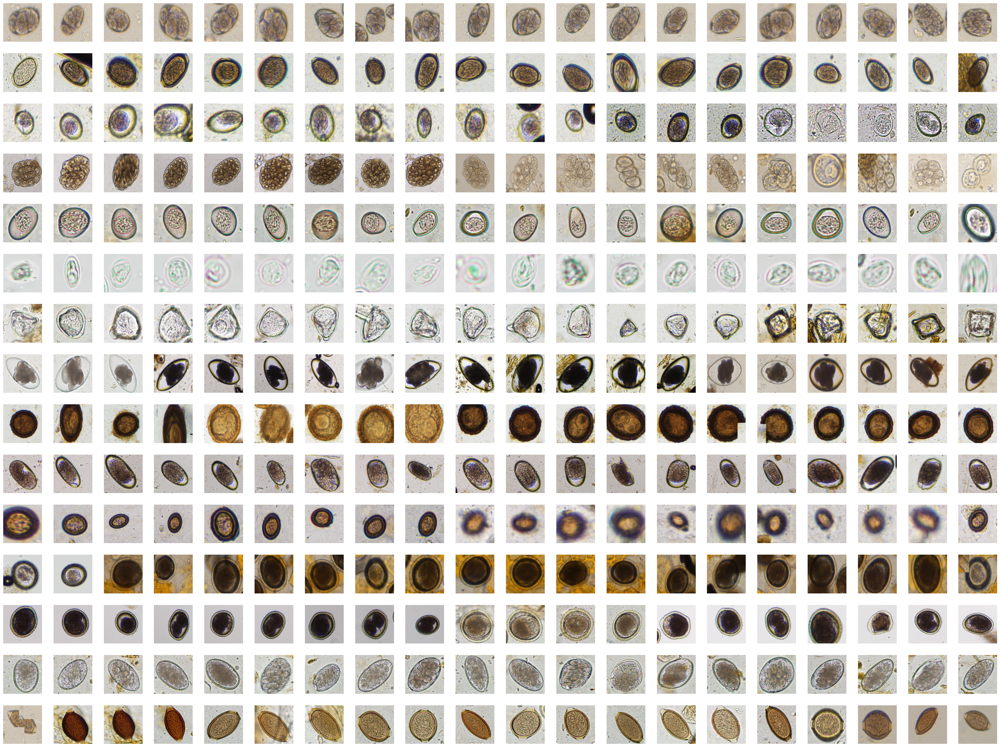

In [7]:
"""Visualize the support set"""

display_images_in_grid(num, version, support_images, 1, new_path)

In [8]:
def euclidean_distance(a, b):
    """
    Computes euclidean distance btw x and y
    Args:
      a (Query Tensor): shape (N, D). N usually n_way*n_query
      b (Proto Tensor): shape (M, D). M usually n_way
    Returns:
      Tensor: shape(N, M). For each query, the distances to each centroid
    """
    N, D = tf.shape(a)[0], tf.shape(a)[1]
    M = tf.shape(b)[0]
    
    a = tf.tile(tf.expand_dims(a, axis=1), (1, M, 1))
    b = tf.tile(tf.expand_dims(b, axis=0), (N, 1, 1))
    return tf.reduce_mean(tf.square(a - b), axis=2)

In [7]:
n_channels = 3

depth=28
width=2
dropout_rate=0.3

base_model = load_model(model_path)

base_model.summary()


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 tf.__operators__.getitem_1  (None, 128, 128, 3)       0         
  (SlicingOpLambda)                                              
                                                                 
 tf.nn.bias_add_1 (TFOpLamb  (None, 128, 128, 3)       0         
 da)                                                             
                                                                 
 model (Functional)          (None, 128)               1471968   
                                                                 
Total params: 1471968 (5.62 MB)
Trainable params: 1468352 (5.60 MB)
Non-trainable params: 3616 (14.12 KB)
_________________________________________________________________


In [10]:
class ImageDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, csv_file, batch_size, image_size):#, shuffle=True):
        self.df = pd.read_csv(csv_file)
        print("Number of Total Cropped Images",len(self.df))
        self.batch_size = batch_size
        self.image_size = image_size
        # self.shuffle = shuffle
        self.indices = self.df.index.tolist()
        # self.on_epoch_end()

    def __len__(self):
        # Number of batches per epoch
        return ceil(len(self.df) / self.batch_size)
        # return int(np.floor(len(self.df) / self.batch_size))

    def __getitem__(self, index):
        # Generate indexes of the batch
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]

        # Slice the DataFrame and retrieve images and paths
        batch_images = []
        batch_paths = []
        for i in batch_indices:
            image_path = self.df.loc[i, 'Cropped_Image_Path']
            batch_images.append(self.load_image(image_path))
            batch_paths.append(image_path)

        return np.array(batch_images), batch_paths

    def load_image(self, image_path):
        # Load an image from file path
        image = cv2.imread(image_path)
        image = cv2.resize(image, self.image_size)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

# Usage
batch_size = 128

data_generator = ImageDataGenerator(csv_file=test_dataset_csv, batch_size=batch_size, image_size=img_size)#, shuffle=False)

print("Number of Batches", len(data_generator))

Number of Total Cropped Images 2128
Number of Batches 17


Batch shape: (128, 128, 128, 3)
Shape of the specified image in batch: (128, 128, 3)
Path of the image in batch 1 at index 0: /media/DiskDrive1/Datasets/Ova_Dataset/Attempt4_data_version/5_Samples/ProtoNet_ProtoKD_data_version/test/Cystoisospora/LG_031_2185.png
Row Number in csv 128
Image Path in csv /media/DiskDrive1/Datasets/Ova_Dataset/Attempt4_data_version/5_Samples/ProtoNet_ProtoKD_data_version/test/Cystoisospora/LG_031_2185.png
The image at index 0 in batch 1 matches the image loaded from the path.


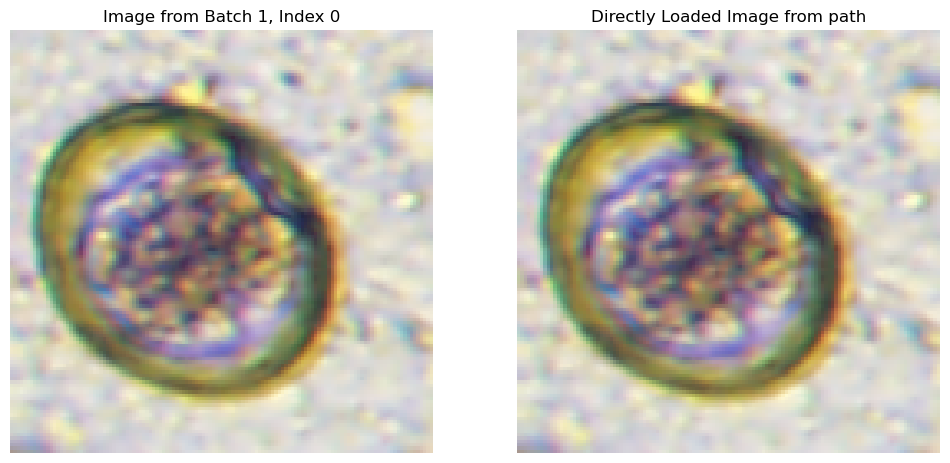

In [11]:
test_generator(test_dataset_csv, batch_size,
               data_generator,  batch_index=1,  image_index=0)

In [12]:
z_support = base_model(support_images)
print("z_support shape",z_support.shape)
z_dim = z_support.shape[-1]
# print(z_dim)

if "NMS_AUG" in version:
    z_support = tf.reshape(z_support, shape=[len(all_label_dict), 2*num, z_dim])        #<<<<<<<<<<<<<<==========================
elif "NO_AUG" in version:
    z_support = tf.reshape(z_support, shape=[len(all_label_dict), num, z_dim])

z_proto = tf.reduce_mean(z_support, axis=1)
print("Prototypes SHape",z_proto.shape)
# np.save('z_proto.npy', z_proto.numpy())

label_to_name = {v: k for k, v in all_label_dict.items()}       #<<<<<<<<<<<<<<===================================

crop_info_df = pd.read_csv(test_dataset_csv)

labels = []

probabilities_list = []

i=0
# Iterate over the data_generator
for batch_images, batch_paths in data_generator:

    mod_out = base_model.predict(batch_images)
    z_query = np.array(mod_out)
    dists = euclidean_distance(z_query, z_proto)
    log_p_y = tf.nn.log_softmax(-dists)
    # print(log_p_y)

    """This is just for storage in csv."""
    p_y = tf.nn.softmax(1/dists)  # Calculate probabilities from log probabilities
    probabilities = p_y.numpy()  # Convert probabilities to numpy for storage
    probabilities_list.append(p_y)  # Collect probabilities
    max_probs = np.max(probabilities, axis=-1)  # Extract maximum probability for each prediction
    """.............................."""

    y_hat = tf.argmax(log_p_y, axis=-1)

    if "NO_BG" in version:
        y_hat = y_hat+1

    # Map y_hat to label_name and append to lists
    labels.extend(y_hat.numpy())
    # label_names.extend([label_to_name[label] for label in y_hat.numpy()])
    print(i)
    i += 1

    # Update the DataFrame
    for path, label, max_prob  in zip(batch_paths, y_hat.numpy(), max_probs):
        crop_info_df.loc[crop_info_df['Cropped_Image_Path'] == path, 'label'] = label
        crop_info_df.loc[crop_info_df['Cropped_Image_Path'] == path, 'max_probability'] = max_prob

print("Results are saved to:", save_results_path)
# Save the updated DataFrame to a new CSV file
crop_info_df.to_csv(save_results_path, index=False)

z_support shape (300, 128)
Prototypes SHape (15, 128)
4/4 [==============================] - 1s 14ms/step
0
4/4 [==============================] - 0s 18ms/step
1
4/4 [==============================] - 0s 18ms/step
2
4/4 [==============================] - 0s 18ms/step
3
4/4 [==============================] - 0s 18ms/step
4
4/4 [==============================] - 0s 18ms/step
5
4/4 [==============================] - 0s 18ms/step
6
4/4 [==============================] - 0s 18ms/step
7
4/4 [==============================] - 0s 18ms/step
8
4/4 [==============================] - 0s 18ms/step
9
4/4 [==============================] - 0s 18ms/step
10
4/4 [==============================] - 0s 18ms/step
11
4/4 [==============================] - 0s 19ms/step
12
4/4 [==============================] - 0s 18ms/step
13
4/4 [==============================] - 0s 18ms/step
14
4/4 [==============================] - 0s 19ms/step
15
3/3 [==============================] - 0s 126ms/step
16
Results are saved to

In [13]:
print(label_to_name, "\n")

# Load the CSV file
csv_path = save_results_path.format(num)
df = pd.read_csv(csv_path)

# Map the 'label' column to 'label_name' using the provided dictionary
df['Predicted_label_name'] = df['label'].map(label_to_name)

# Save the updated DataFrame back to the CSV
df.to_csv(detections_csv_file, index=False)
print(f"CSV file with label names is saved to {detections_csv_file}")

{1: 'Ancylostoma', 2: 'Capillaria', 3: 'Cystoisospora', 4: 'Dipylidium', 5: 'Eimeria', 6: 'Giardia', 7: 'Moniezia', 8: 'Nematodirus', 9: 'Parascaris', 10: 'Strongyle', 11: 'Taenia', 12: 'Toxascaris', 13: 'Toxocara', 14: 'Trichostrongyle', 15: 'Trichuris'} 

CSV file with label names is saved to Inference_Ablation_Results/20_NO_BG_NO_NMS_NO_AUG/detections_info_with_Label_Names_20_NO_BG_NO_NMS_NO_AUG.csv


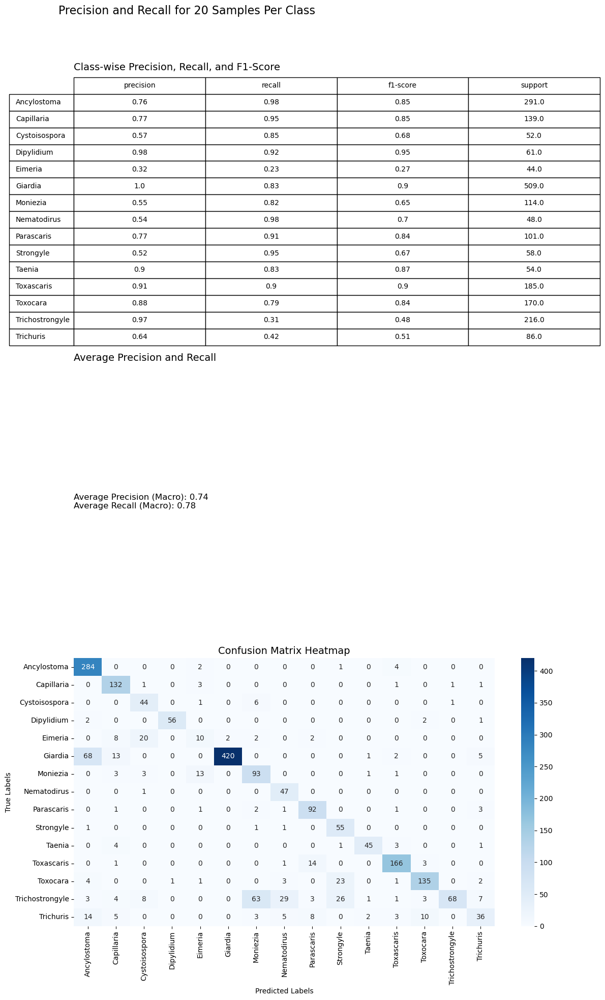

Precision, recall, and heatmap saved to: Inference_Ablation_Results/20_NO_BG_NO_NMS_NO_AUG/20_precision_recall.png


In [14]:
generate_precision_recall_heatmap(num, detections_csv_file, output_png_path)

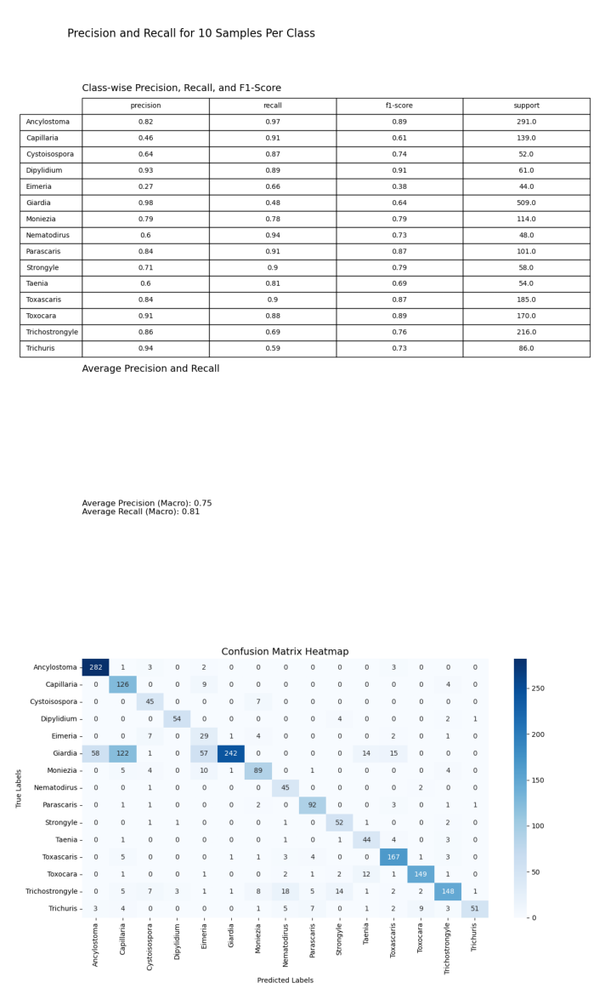

In [25]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def display_image(image_path):
    """
    Displays an image from the given file path.

    Args:
        image_path (str): Path to the image file.

    Returns:
        None
    """
    # Load and display the image
    img = mpimg.imread(image_path)
    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.axis('off')  # Hide axes for a cleaner display
    plt.show()

# Example usage
temp = 10
display_image(f"/home/szt/ProtoKD_Extension_October_2024/Experiments/ProtoNet/Inference_Ablation_Results/{temp}_NO_BG_NO_NMS_NO_AUG/{temp}_precision_recall.png")  # Replace with your image path
